In [22]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler #子集的子集
from umap import UMAP
import plotly.express as px #别名
import seaborn as sns #seaborn是python中的一个可视化库
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt #pyplot 主要用于交互式绘图以及较为简单的绘图
from sklearn import metrics #子集
from pandas import read_csv #函数read_csv属于库pandas

In [23]:
t6_df = read_csv('./t6.csv', sep=',', header=0, index_col=0) #pd=pandas，处理数组；sep：分隔符；
t6_df.columns #打印列索引

Index(['Stems', 'Branches', 'Length', 'AverageBifurcationAngleLocal',
       'AverageBifurcationAngleRemote', 'HausdorffDimension'],
      dtype='object')

In [24]:
t6_df.index #打印行索引

Index(['00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc',
       '00006_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_10_54.ano.eswc',
       '00008_P001_T01-S001_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_11_10_02.ano.eswc',
       '00011_P001_T01-S002_MFG_R0460_WY-20220415_XJ_stamp_2022_08_31_14_28.ano.eswc',
       '00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc',
       '00015_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_31.ano.eswc',
       '00023_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_32.ano.eswc',
       '00024_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_10_11_25.ano.eswc',
       '00027_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_34.ano.eswc',
       '00029_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_35.ano.eswc',
       ...
       '01688_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_27_14_18.ano.eswc',
       '01690_P018_T01-S

In [25]:
type(t6_df) #输出类名

pandas.core.frame.DataFrame

In [28]:
t1_grp_df = pd.read_csv('./t1_grp.csv', sep=',', header=0, index_col=0)
# df = t1_grp_df[['Stems', 'Branches', 'Length', 'AverageBifurcationAngleLocal',
#        'AverageBifurcationAngleRemote', 'HausdorffDimension']] #取表t1的子集
df = t1_grp_df
df = df[df['Length'] >= 2500]
hue_type = 'BrainRgn' #变量名；实际含义？
labels_ori = t1_grp_df[['BrainRgn', 'Age', 'Sex']]
# 'BrainRgn', 'Age', 'Sex'
# labels = df['Stems'].copy()

for i in labels_ori.index:
    labels_ori.loc[i,'Age'] = int(labels_ori.loc[i,'Age']/5)*5 #loc：位置变量，取相应坐标下表格中的内容；对年龄的处理？

print('ori labels: ',labels_ori[hue_type].unique()) #unique：去除重复数字
print(labels_ori[hue_type].value_counts(), '\n') #计算每个年龄的数据量

# 1
labels = labels_ori.loc[~labels_ori.BrainRgn.isin(['SMFG', 'SMIFG','SFG','MTG','IFG']), [hue_type]] #筛选样本
labels_ori = labels_ori[~labels_ori.BrainRgn.isin(['SMFG', 'SMIFG','SFG','MTG','IFG'])] #删除了这些脑区的样本，去除了数据量较少的脑区

# 2
# labels = labels_ori.loc[labels_ori.BrainRgn.isin(['MFG','PL']), [hue_type]]
# labels_ori = labels_ori[labels_ori.BrainRgn.isin(['MFG','PL'])]

print('after labels: ', labels[hue_type].unique())
print(labels[hue_type].value_counts())
labels

ori labels:  ['MFG' 'SFG' 'IPL' 'IFG' 'STG' 'MTG' 'TP' 'PL' 'SMFG' 'SMIFG']
MFG      304
TP       174
STG      131
IPL      112
PL        91
SFG       14
MTG       12
SMFG       5
SMIFG      5
IFG        4
Name: BrainRgn, dtype: int64 

after labels:  ['MFG' 'IPL' 'STG' 'TP' 'PL']
MFG    304
TP     174
STG    131
IPL    112
PL      91
Name: BrainRgn, dtype: int64


,BrainRgn
Name,
00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc,MFG
00006_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_10_54.ano.eswc,MFG
00008_P001_T01-S001_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_11_10_02.ano.eswc,MFG
00011_P001_T01-S002_MFG_R0460_WY-20220415_XJ_stamp_2022_08_31_14_28.ano.eswc,MFG
00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc,MFG
...,...
01698_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_22_15_41.ano.eswc,PL
01699_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_25_09_12.ano.eswc,PL
01701_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_22_15_22.ano.eswc,PL


In [29]:
df

,BrainRgn,Age,Sex,Nodes,SomaSurface,Stems,Bifurcations,Branches,Tips,OverallWidth,...,Volume,MaxEuclideanDistance,MaxPathDistance,MaxBranchOrder,AverageContraction,AverageFragmentation,AverageParent-daughterRatio,AverageBifurcationAngleLocal,AverageBifurcationAngleRemote,HausdorffDimension
Name,,,,,,,,,,,,,,,,,,,,,
00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc,MFG,49,M,1749,12.5664,8,40,86,47,223.100,...,7979.01,140.560,161.173,5,0.913690,19.3256,1.000000,88.3595,60.3844,1.06136
00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc,MFG,49,M,1309,25048.1000,11,47,104,58,230.920,...,50325.50,149.189,209.372,9,0.932546,11.5769,0.863606,69.6403,59.4337,1.10682
00023_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_32.ano.eswc,MFG,49,M,1431,12.5664,10,42,92,51,234.140,...,18657.30,158.362,186.089,10,0.924517,14.5435,1.137220,71.2530,59.0839,1.12442
00024_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_10_11_25.ano.eswc,MFG,49,M,2135,12.5664,9,43,93,51,231.380,...,9097.00,168.166,207.627,10,0.894497,21.9462,1.000000,66.8152,60.9891,1.12950
00029_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_35.ano.eswc,MFG,49,M,1920,10399.2000,13,56,123,68,233.216,...,61554.50,161.626,196.770,8,0.912777,14.6016,0.829583,72.7305,57.5899,1.14330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
01679_P018_T01-S014_SPL_R0613_LJ-20220728_YXQ_stamp_2022_08_27_13_22.ano.eswc,PL,41,F,1532,12.5664,7,35,75,41,305.887,...,8717.51,210.740,230.124,7,0.932857,19.4133,1.000000,75.9669,61.5857,1.07693
01681_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_25.ano.eswc,PL,41,F,1433,12.5664,5,36,75,40,408.036,...,10221.00,222.416,249.329,8,0.928284,18.0933,1.000000,69.6551,57.5826,1.06095
01682_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_27.ano.eswc,PL,41,F,1473,12.5664,7,36,77,42,335.435,...,9858.95,209.427,232.224,8,0.918780,18.1169,1.000000,66.9616,61.0914,1.08275


In [30]:
labels_ori

,BrainRgn,Age,Sex
Name,,,
00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc,MFG,45,M
00006_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_10_54.ano.eswc,MFG,45,M
00008_P001_T01-S001_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_11_10_02.ano.eswc,MFG,45,M
00011_P001_T01-S002_MFG_R0460_WY-20220415_XJ_stamp_2022_08_31_14_28.ano.eswc,MFG,45,M
00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc,MFG,45,M
...,...,...,...
01698_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_22_15_41.ano.eswc,PL,40,F
01699_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_25_09_12.ano.eswc,PL,40,F
01701_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_22_15_22.ano.eswc,PL,40,F


In [31]:
df = df.loc[df.index,:] 
df = df.iloc[:, 3:]
df

,Nodes,SomaSurface,Stems,Bifurcations,Branches,Tips,OverallWidth,OverallHeight,OverallDepth,AverageDiameter,...,Volume,MaxEuclideanDistance,MaxPathDistance,MaxBranchOrder,AverageContraction,AverageFragmentation,AverageParent-daughterRatio,AverageBifurcationAngleLocal,AverageBifurcationAngleRemote,HausdorffDimension
Name,,,,,,,,,,,,,,,,,,,,,
00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc,1749,12.5664,8,40,86,47,223.100,230.920,104.0,1.99886,...,7979.01,140.560,161.173,5,0.913690,19.3256,1.000000,88.3595,60.3844,1.06136
00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc,1309,25048.1000,11,47,104,58,230.920,209.760,149.0,2.24216,...,50325.50,149.189,209.372,9,0.932546,11.5769,0.863606,69.6403,59.4337,1.10682
00023_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_32.ano.eswc,1431,12.5664,10,42,92,51,234.140,232.148,128.0,2.09729,...,18657.30,158.362,186.089,10,0.924517,14.5435,1.137220,71.2530,59.0839,1.12442
00024_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_10_11_25.ano.eswc,2135,12.5664,9,43,93,51,231.380,207.920,99.0,1.99906,...,9097.00,168.166,207.627,10,0.894497,21.9462,1.000000,66.8152,60.9891,1.12950
00029_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_35.ano.eswc,1920,10399.2000,13,56,123,68,233.216,233.220,110.0,2.24393,...,61554.50,161.626,196.770,8,0.912777,14.6016,0.829583,72.7305,57.5899,1.14330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
01679_P018_T01-S014_SPL_R0613_LJ-20220728_YXQ_stamp_2022_08_27_13_22.ano.eswc,1532,12.5664,7,35,75,41,305.887,280.141,89.0,1.99869,...,8717.51,210.740,230.124,7,0.932857,19.4133,1.000000,75.9669,61.5857,1.07693
01681_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_25.ano.eswc,1433,12.5664,5,36,75,40,408.036,323.488,102.0,1.99860,...,10221.00,222.416,249.329,8,0.928284,18.0933,1.000000,69.6551,57.5826,1.06095
01682_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_27.ano.eswc,1473,12.5664,7,36,77,42,335.435,303.270,93.0,1.99864,...,9858.95,209.427,232.224,8,0.918780,18.1169,1.000000,66.9616,61.0914,1.08275


In [32]:
x = df.values #df.values的作用是返回numpy数组表示的数据
x.shape

(529, 22)

In [33]:
std = StandardScaler() #StandardScaler类是一个用来讲数据进行归一化和标准化的类。-计算训练集的平均值和标准差
pca = PCA(0.99)

In [34]:
x_std = std.fit_transform(x) #fit_transfor：某种标准化
print('x_std shape: ', x_std.shape)

x_pca = pca.fit_transform(x_std)
print('x_pca shape: ', x_pca.shape)

x_std shape:  (529, 22)
x_pca shape:  (529, 16)


In [35]:
x_std

array([[-0.62530502, -0.33712178, -0.48119219, ...,  1.34951597,
         0.15827781, -0.6919236 ],
       [-1.40026081,  8.38836132,  0.77275199, ..., -1.05790159,
        -0.03249465, -0.07245409],
       [-1.18538671, -0.33712178,  0.3547706 , ..., -0.8504973 ,
        -0.10268735,  0.16737573],
       ...,
       [-1.11141365, -0.33712178, -0.89917358, ..., -1.40240079,
         0.30014814, -0.40044861],
       [-1.21004439, -0.33712178, -0.48119219, ..., -1.08036921,
         0.24221608,  0.07158007],
       [-0.26600734, -0.33712178, -0.0632108 , ...,  0.55587017,
        -0.70343897,  0.07525928]])

In [36]:
x_pca

array([[-3.13610117e+00, -2.24732283e-01,  5.45255329e-02, ...,
        -2.21967058e-01, -4.74787965e-04,  1.00655282e-01],
       [ 1.01835558e+00, -2.95059508e+00,  5.54092738e+00, ...,
        -1.14919976e+00,  4.10577077e+00,  3.16267994e-01],
       [-1.38408953e+00, -8.59947812e-01,  3.66712771e-01, ...,
        -6.69825861e-02,  1.69454849e-02, -1.48068773e-01],
       ...,
       [-6.12120269e-01, -2.93873640e+00, -1.64616820e+00, ...,
         3.34271564e-01,  2.65400839e-01, -8.06155404e-02],
       [-1.32376256e+00, -1.74825285e+00, -8.89991917e-01, ...,
        -7.74353815e-01,  4.47598635e-02,  1.09252316e-01],
       [-3.26144364e-01, -3.45318481e-01, -9.86753341e-01, ...,
         5.68522557e-01,  3.20786672e-01, -3.73372221e-01]])

In [60]:
# df_std = pd.DataFrame(
#             x_std,
#             columns=df.columns, 
#             index=df.index
#             )
# df_std['hue'] = labels
# df_std

In [37]:
df['hue'] = labels #表格中添加了“hue”一列，内容为labels
df

,Nodes,SomaSurface,Stems,Bifurcations,Branches,Tips,OverallWidth,OverallHeight,OverallDepth,AverageDiameter,...,MaxEuclideanDistance,MaxPathDistance,MaxBranchOrder,AverageContraction,AverageFragmentation,AverageParent-daughterRatio,AverageBifurcationAngleLocal,AverageBifurcationAngleRemote,HausdorffDimension,hue
Name,,,,,,,,,,,,,,,,,,,,,
00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc,1749,12.5664,8,40,86,47,223.100,230.920,104.0,1.99886,...,140.560,161.173,5,0.913690,19.3256,1.000000,88.3595,60.3844,1.06136,MFG
00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc,1309,25048.1000,11,47,104,58,230.920,209.760,149.0,2.24216,...,149.189,209.372,9,0.932546,11.5769,0.863606,69.6403,59.4337,1.10682,MFG
00023_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_32.ano.eswc,1431,12.5664,10,42,92,51,234.140,232.148,128.0,2.09729,...,158.362,186.089,10,0.924517,14.5435,1.137220,71.2530,59.0839,1.12442,MFG
00024_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_10_11_25.ano.eswc,2135,12.5664,9,43,93,51,231.380,207.920,99.0,1.99906,...,168.166,207.627,10,0.894497,21.9462,1.000000,66.8152,60.9891,1.12950,MFG
00029_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_35.ano.eswc,1920,10399.2000,13,56,123,68,233.216,233.220,110.0,2.24393,...,161.626,196.770,8,0.912777,14.6016,0.829583,72.7305,57.5899,1.14330,MFG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
01679_P018_T01-S014_SPL_R0613_LJ-20220728_YXQ_stamp_2022_08_27_13_22.ano.eswc,1532,12.5664,7,35,75,41,305.887,280.141,89.0,1.99869,...,210.740,230.124,7,0.932857,19.4133,1.000000,75.9669,61.5857,1.07693,PL
01681_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_25.ano.eswc,1433,12.5664,5,36,75,40,408.036,323.488,102.0,1.99860,...,222.416,249.329,8,0.928284,18.0933,1.000000,69.6551,57.5826,1.06095,PL
01682_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_27.ano.eswc,1473,12.5664,7,36,77,42,335.435,303.270,93.0,1.99864,...,209.427,232.224,8,0.918780,18.1169,1.000000,66.9616,61.0914,1.08275,PL


<Figure size 1500x1500 with 0 Axes>

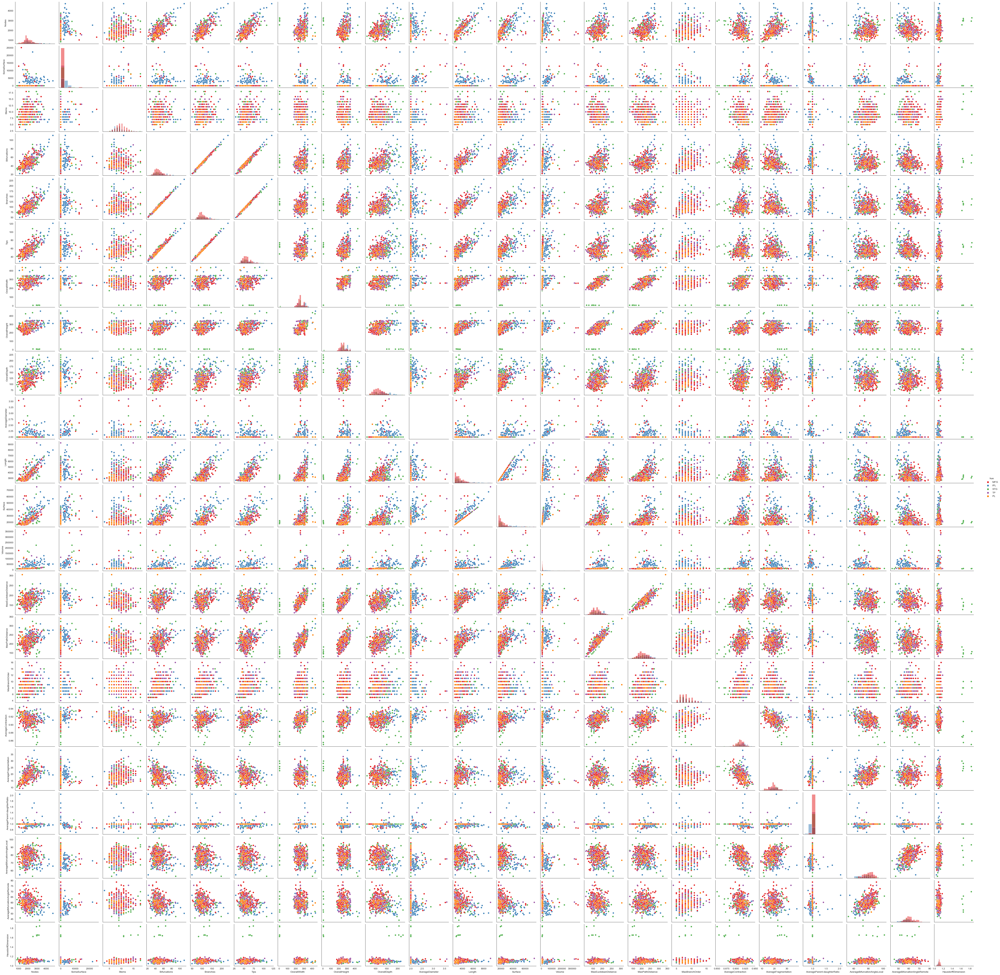

In [38]:
sns.set_style('white')
plt.figure(figsize=(15,15)) #figsize是设置幕布大小尺寸
sns.pairplot(df, hue='hue', #用来展示两两特征之间的关系；用hue进行分类（颜色）
            # palette='Reds',
              palette='Set1', 
             diag_kind='hist')
plt.savefig('./pairplot_raw_'+hue_type+'.png', dpi=200)

In [39]:
#plt.figure(figsize=(15,15))
#sns.pairplot(df_std, hue='hue', palette='Set2', diag_kind='hist')
#plt.savefig('./pairplot_std_'+hue_type+'.png', dpi=200)

In [40]:
my_umap = UMAP(n_components=2,n_neighbors=30, random_state=10, min_dist=0.2) #降维
x_umap = my_umap.fit_transform(x_std.copy()) #copy x_pca内容作为fit_transform的参数
figure_df = pd.DataFrame({
    'x_std':x_std[:,0], 
    'y_std':x_std[:,1],              
    'hue':df['hue'], 
#     'neuron_id':subtype_data.index.tolist()
    })
# figure_df['hue'] = figure_df['hue'].astype(float)
# figure_df
figure_df['x_umap'] = x_umap[:,0]
figure_df['y_umap'] = x_umap[:,1]

In [23]:
#my_umap = UMAP(n_components=2,n_neighbors=30, random_state=10, min_dist=0.2) #降维
#x_umap = my_umap.fit_transform(x_pca.copy()) #copy x_pca内容作为fit_transform的参数
#figure_df = pd.DataFrame({
#   'x_pca':x_pca[:,0], 
#   'y_pca':x_pca[:,1],              
#    'hue':df['hue'], 
#     'neuron_id':subtype_data.index.tolist()
#    })
# figure_df['hue'] = figure_df['hue'].astype(float)
# figure_df
#figure_df['x_umap'] = x_umap[:,0]
#figure_df['y_umap'] = x_umap[:,1]

In [41]:
x_std

array([[-0.62530502, -0.33712178, -0.48119219, ...,  1.34951597,
         0.15827781, -0.6919236 ],
       [-1.40026081,  8.38836132,  0.77275199, ..., -1.05790159,
        -0.03249465, -0.07245409],
       [-1.18538671, -0.33712178,  0.3547706 , ..., -0.8504973 ,
        -0.10268735,  0.16737573],
       ...,
       [-1.11141365, -0.33712178, -0.89917358, ..., -1.40240079,
         0.30014814, -0.40044861],
       [-1.21004439, -0.33712178, -0.48119219, ..., -1.08036921,
         0.24221608,  0.07158007],
       [-0.26600734, -0.33712178, -0.0632108 , ...,  0.55587017,
        -0.70343897,  0.07525928]])

In [42]:
x_umap.shape

(529, 2)

In [43]:
figure_df

,x_std,y_std,hue,x_umap,y_umap
Name,,,,,
00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc,-0.625305,-0.337122,MFG,-1.725804,2.315945
00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc,-1.400261,8.388361,MFG,1.249529,-3.286740
00023_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_32.ano.eswc,-1.185387,-0.337122,MFG,0.003237,0.237220
00024_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_10_11_25.ano.eswc,0.054543,-0.337122,MFG,-0.485296,1.140805
00029_P001_T01-S001_MFG_R0460_WY-20220415_GYC_stamp_2022_08_31_14_35.ano.eswc,-0.324129,3.282869,MFG,1.193353,-3.064994
...,...,...,...,...,...
01679_P018_T01-S014_SPL_R0613_LJ-20220728_YXQ_stamp_2022_08_27_13_22.ano.eswc,-1.007499,-0.337122,PL,0.769675,-0.702710
01681_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_25.ano.eswc,-1.181864,-0.337122,PL,0.733664,-0.983703
01682_P018_T01-S014_SPL_R0919_LJ-20220728_YXQ_stamp_2022_08_27_13_27.ano.eswc,-1.111414,-0.337122,PL,0.742167,-0.729059


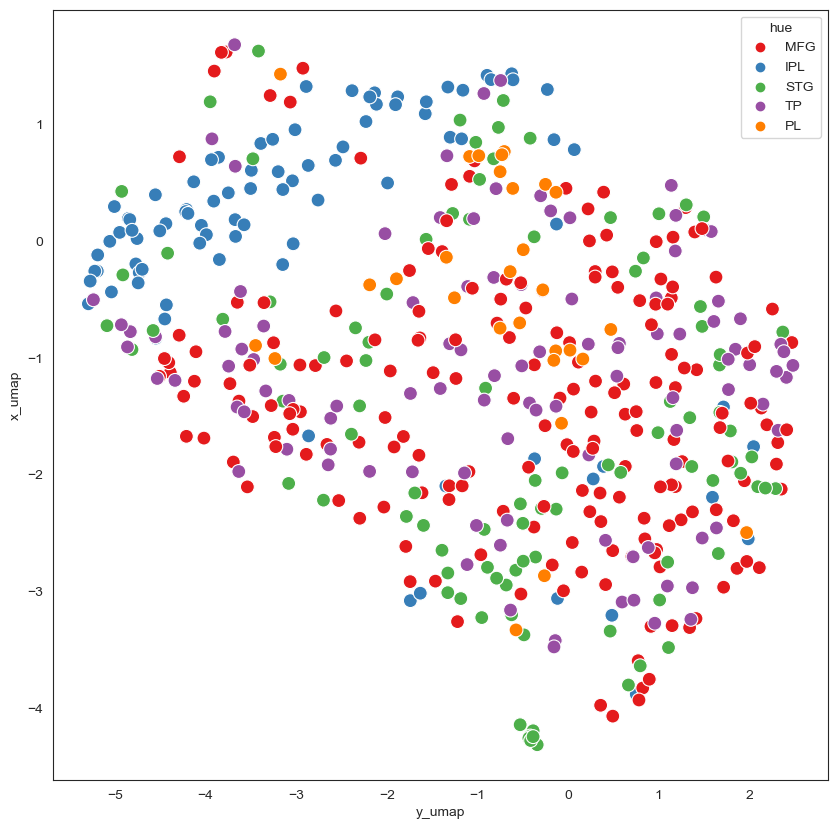

In [44]:
plt.figure(figsize=(10,10))
sns.scatterplot(x=figure_df['y_umap'], y=figure_df['x_umap'], hue=figure_df['hue'], #x、y轴取值及颜色分类
                palette='Set1',
              #palette=sns.diverging_palette(240, 10, n=6, as_cmap=True), #一种颜色变化
               s=100,
                hue_norm=(-100,100)
               )
plt.savefig('./umap_'+hue_type+'.png', dpi=200)

In [125]:
sns.light_palette((260, 75, 60), input="husl")

[(0.9421819918111672, 0.9432266193679569, 0.9498462205167962),
 (0.8469568241944938, 0.8640574828228126, 0.9383849551740686),
 (0.7517316565778204, 0.7848883462776681, 0.9269236898313409),
 (0.6565064889611469, 0.7057192097325238, 0.9154624244886133),
 (0.5612813213444735, 0.6265500731873794, 0.9040011591458855),
 (0.4660561537278001, 0.5473809366422351, 0.8925398938031579)]

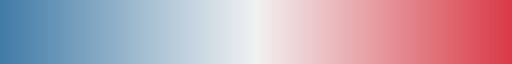

In [126]:
#                 'Set1',
sns.diverging_palette(240, 10, n=6, as_cmap=True)

In [127]:
x.shape

(812, 6)

In [128]:
x_umap.shape

(812, 2)

In [129]:
labels

,Age
Name,
00005_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_09_53.ano.eswc,45
00006_P001_T01-S001_MFG_R0460_WY-20220415_LJ_stamp_2022_08_10_10_54.ano.eswc,45
00008_P001_T01-S001_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_11_10_02.ano.eswc,45
00011_P001_T01-S002_MFG_R0460_WY-20220415_XJ_stamp_2022_08_31_14_28.ano.eswc,45
00014_P001_T01-S002_MFG_R0460_WY-20220415_YXQ_stamp_2022_08_31_14_30.ano.eswc,45
...,...
01698_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_22_15_41.ano.eswc,40
01699_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_25_09_12.ano.eswc,40
01701_P018_T01-S014_SPL_R0460_LJ-20220728_YXQ_stamp_2022_08_22_15_22.ano.eswc,40


In [130]:
print('umap layout下的聚类评价')
print(metrics.silhouette_score(x_umap, labels, metric='euclidean')) # -1, +1 （越高越好）
print(metrics.calinski_harabasz_score(x_umap, labels, )) # 0, +无穷 （越接近0越好）
print(metrics.davies_bouldin_score(x_umap, labels, )) # 0， +无穷 （越接近0越好）

umap layout下的聚类评价
-0.3577944
9.611251543353076
6.818688422068218


D:\ProgramData\Anaconda3\envs\neuronbeta\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
D:\ProgramData\Anaconda3\envs\neuronbeta\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
D:\ProgramData\Anaconda3\envs\neuronbeta\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [131]:
print('pca layout下的聚类评价')
print(metrics.silhouette_score(x_pca, labels, metric='euclidean')) # -1, +1 （越高越好）
print(metrics.calinski_harabasz_score(x_pca, labels, )) # 0, +无穷 （越接近0越好）
print(metrics.davies_bouldin_score(x_pca, labels, )) # 0， +无穷 （越接近0越好）

pca layout下的聚类评价
-0.2791609211530077
8.352393730620454
6.923694583823617


D:\ProgramData\Anaconda3\envs\neuronbeta\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
D:\ProgramData\Anaconda3\envs\neuronbeta\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
D:\ProgramData\Anaconda3\envs\neuronbeta\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
